# View Cell Neighborhood using Alphashape
Data is obtained from 10X Genomics

In [1]:
%load_ext autoreload
%autoreload 2
%env ANYWIDGET_HMR=1

env: ANYWIDGET_HMR=1


In [2]:
import celldega as dega
import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from celldega.pre import _to_geometry
import geopandas as gpd
from celldega.pre.boundary_tile import batch_transform_geometries
import geopandas as gpd


# Data initialization

In [3]:
# dataset_name = 'Xenium_Prime_Ovarian_Cancer_FFPE_XRrun_outs'
dataset_name = 'Xenium_V1_human_Pancreas_FFPE_outs'
tech = 'Xenium'

DATA_DIR = f'../data'
data_dir = f'{DATA_DIR}/{dataset_name}'
path_landscape_files = f'landscape_files/{dataset_name}'

## Load region polygon (both in pixel and micron space)


In [4]:
# Load Geo parquet
gdf_micron = gpd.read_parquet(f'{path_landscape_files}/spatial_regions/sketched_regions_micron.parquet')

## Calculate alphashapes and convert to micron space

In [14]:
meta_cell_ini = pd.read_parquet(f'{path_landscape_files}/cell_metadata.parquet')
cluster = pd.read_parquet(f'{path_landscape_files}/cell_clusters/cluster.parquet')
meta_cluster = pd.read_parquet(f'{path_landscape_files}/cell_clusters/meta_cluster.parquet')
meta_cell = meta_cell_ini.copy()
meta_cell['cluster'] = meta_cell['name'].map(cluster['cluster'])

# Calculate alpha shape
gdf_alpha_pixel = dega.nbhd.alpha_shape_cell_clusters(meta_cell, cat='cluster', alphas=[100, 150, 200, 250, 300, 350])

# Explode MultiPolygon geometries into individual Polygons
gdf_alpha_pixel = gdf_alpha_pixel.explode(index_parts=True)

# Reset the index (optional, but recommended for clean indexing)
gdf_alpha_pixel = gdf_alpha_pixel.reset_index(drop=True)

gdf_alpha_micron = gdf_alpha_pixel.copy()

# Convert to micron space
path_transformation_matrix = f'{path_landscape_files}/micron_to_image_transform.csv'

transformation_matrix = pd.read_csv(
    path_transformation_matrix, header=None, sep=" "
).values

# From pixel to micron space
inverse_matrix = np.linalg.inv(transformation_matrix)

gdf_alpha_micron["geometry"] = batch_transform_geometries(gdf_alpha_micron["geometry"], inverse_matrix, 1)

/var/folders/nj/jhgl3gz93qjgmsh3qn7y44pw0000gp/T/ipykernel_33411/3064042266.py:28: UserWarning: Geometry column does not contain geometry.
  gdf_alpha_micron["geometry"] = batch_transform_geometries(gdf_alpha_micron["geometry"], inverse_matrix, 1)


In [15]:
gdf_alpha_micron['geometry'] = gdf_alpha_micron['geometry'].apply(_to_geometry)

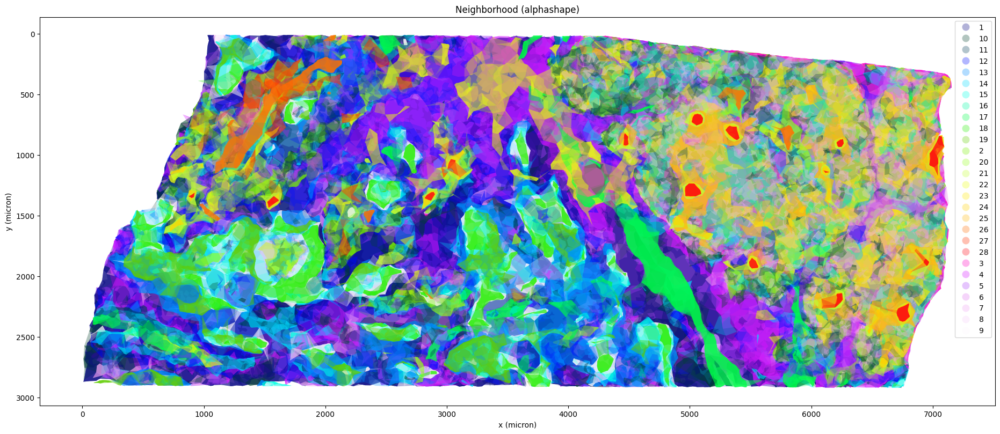

In [16]:
subset_view = False

fig, ax = plt.subplots(figsize=(20,8))
gdf_micron.plot(ax=ax, column='roi', legend=True, cmap='viridis', alpha=0.1)
gdf_alpha_micron.plot(ax=ax, aspect=1, column='cat', legend=True, cmap='gist_ncar', alpha=0.3)
# gdf_micron.plot(ax=ax, column='roi', legend=True, cmap='viridis', alpha=0.9, edgecolor='black', facecolor='none')
ax.invert_yaxis()
plt.title(f"Neighborhood (alphashape)")
plt.tight_layout()
plt.xlabel('x (micron)')
plt.ylabel('y (micron)')
if subset_view:
    plt.xlim(1000, 3000)
    plt.ylim(1400, 2500)
plt.show()

In [17]:
if not os.path.exists(f'{path_landscape_files}/spatial_regions'):
    os.makedirs(f'{path_landscape_files}/spatial_regions') # nbhd

gdf_alpha_pixel.to_parquet(f'{path_landscape_files}/spatial_regions/alphasahpe_region_pixel.parquet', index=False)
gdf_alpha_micron.to_parquet(f'{path_landscape_files}/spatial_regions/alphasahpe_region_micron.parquet', index=False)

In [18]:
gdf_alpha_pixel.head()

,name,cat,inv_alpha,area,geometry
0,1_350,1,350.0,3.127311e+08,"POLYGON ((5713.570 13664.100, 5790.540 13669.0..."
1,1_350,1,350.0,3.127311e+08,"POLYGON ((29972.140 3234.680, 29691.480 3693.8..."
2,1_350,1,350.0,3.127311e+08,"POLYGON ((32581.150 5644.090, 32757.510 5698.4..."
3,1_350,1,350.0,3.127311e+08,"POLYGON ((29731.990 6819.540, 30012.150 6722.9..."
4,1_350,1,350.0,3.127311e+08,"POLYGON ((26357.400 1050.530, 26318.720 1579.9..."


In [19]:
gdf_alpha_micron.head()

,name,cat,inv_alpha,area,geometry
0,1_350,1,350.0,3.127311e+08,"POLYGON ((1214.134 2903.621, 1230.490 2904.673..."
1,1_350,1,350.0,3.127311e+08,"POLYGON ((6369.080 687.370, 6309.440 784.941, ..."
2,1_350,1,350.0,3.127311e+08,"POLYGON ((6923.495 1199.369, 6960.971 1210.925..."
3,1_350,1,350.0,3.127311e+08,"POLYGON ((6318.048 1449.152, 6377.582 1428.631..."
4,1_350,1,350.0,3.127311e+08,"POLYGON ((5600.948 223.238, 5592.728 335.735, ..."
